In [9]:
from pathlib import Path
import xdem
from xdem.terrain import slope
import matplotlib.pyplot as plt
import numpy as np
import rasterio


In [10]:
from src.myio import reader

In [4]:
reader = reader("DATA_UTM/dem")

dem_root = Path(reader.full_path)

In [5]:
dem_paths = list(dem_root.rglob("*.tif"))  # або просто "*.tif" якщо потрібно всі
print(dem_paths)

[PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/alos_dem_utm32635.tif'), PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/aster_dem_utm32635.tif'), PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/copernicus_dеm_utm32635.tif'), PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/fab_dem_utm32635.tif'), PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/nasa_dem_utm32635.tif'), PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/srtm_dem_utm32635.tif'), PosixPath('/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/tan_dem_utm32635.tif')]


In [6]:
import xdem

In [7]:
from xdem.terrain import get_terrain_attribute

for path in dem_paths:
    print(path)
    dem = xdem.DEM(path)
    print(dem)

    # slope = get_terrain_attribute(dem.data, dem.transform, attribute="slope")
    # print(f"{path.name}: slope mean = {slope.mean():.2f}°")


/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/alos_dem_utm32635.tif
not_loaded
/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/aster_dem_utm32635.tif
not_loaded
/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/copernicus_dеm_utm32635.tif
not_loaded
/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/fab_dem_utm32635.tif
not_loaded
/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/nasa_dem_utm32635.tif
not_loaded
/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/srtm_dem_utm32635.tif
not_loaded
/mnt/c/Users/5302/OneDrive/PhD/paper_DEM_artickle/data/DATA_UTM/dem/tan_dem_utm32635.tif
not_loaded


In [11]:

def plot_attribute(attribute, cmap, label=None, vlim=None):
    if vlim is not None:
        if isinstance(vlim, (int, float)):
            vlims = {"vmin": -vlim, "vmax": vlim}
        elif isinstance(vlim, (list, tuple)) and len(vlim) == 2:
            vlims = {"vmin": vlim[0], "vmax": vlim[1]}
        else:
            vlims = {}
    else:
        vlims = {}

    attribute.plot(cmap=cmap, cbar_title=label, **vlims)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.show()



📂 alos_dem_utm32635.tif


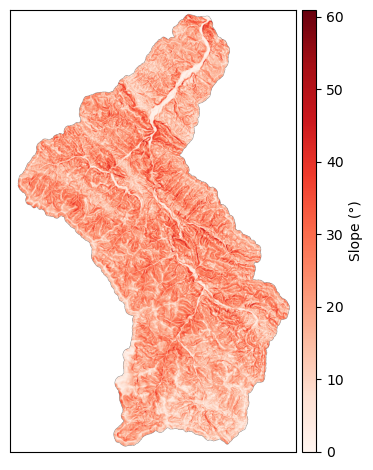

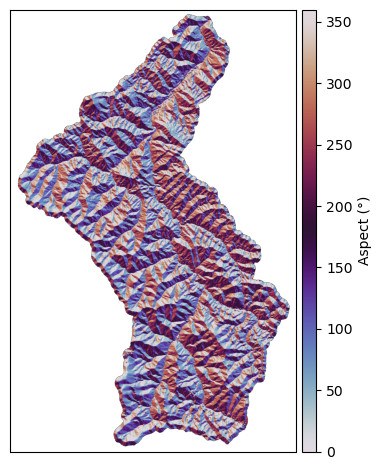

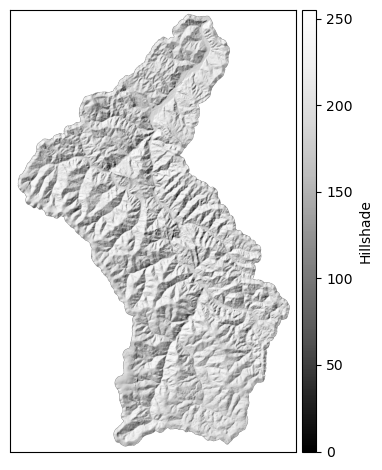

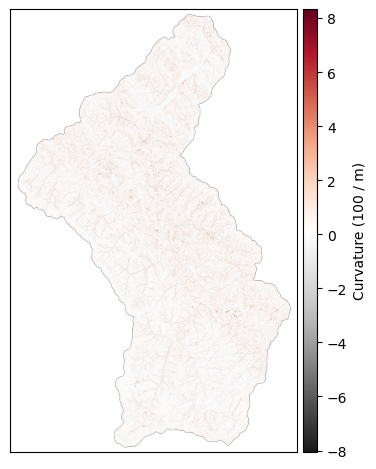

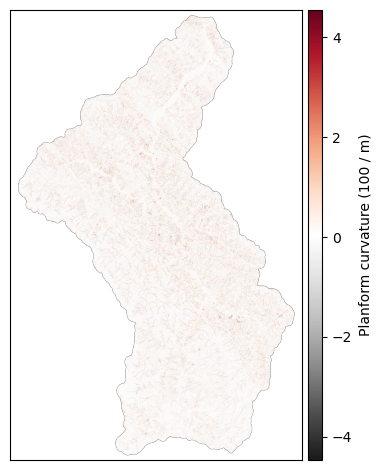

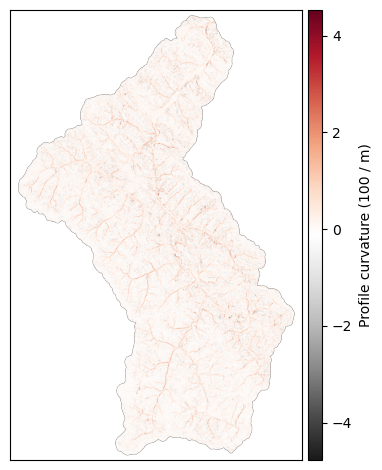

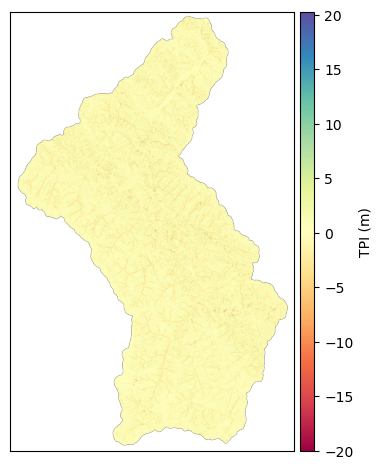

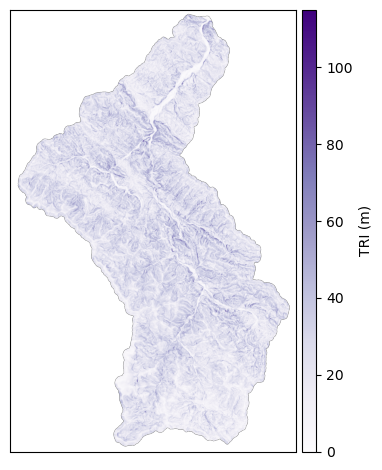

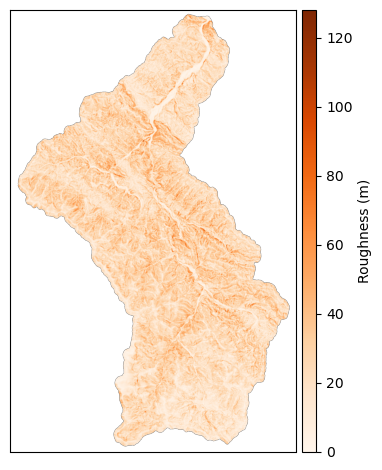

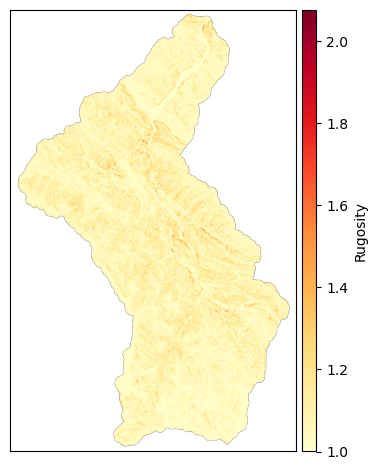


📂 aster_dem_utm32635.tif


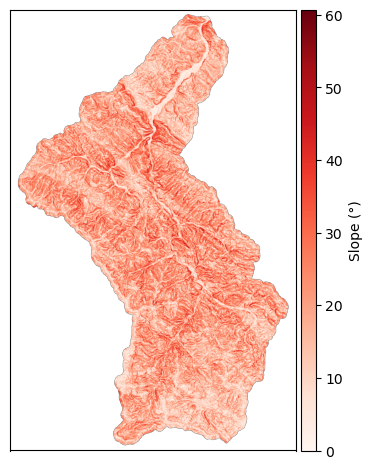

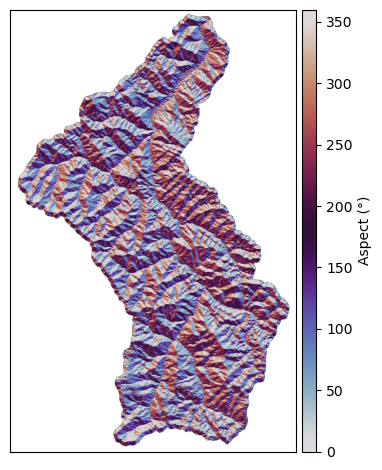

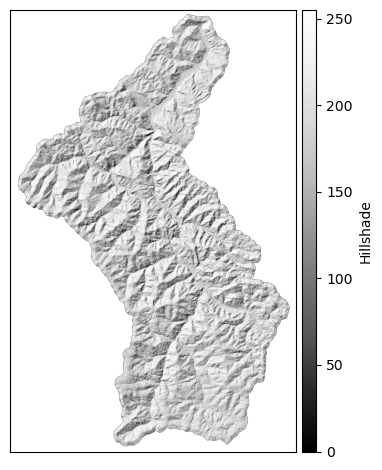

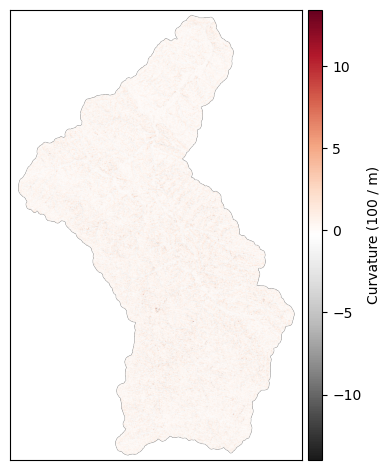

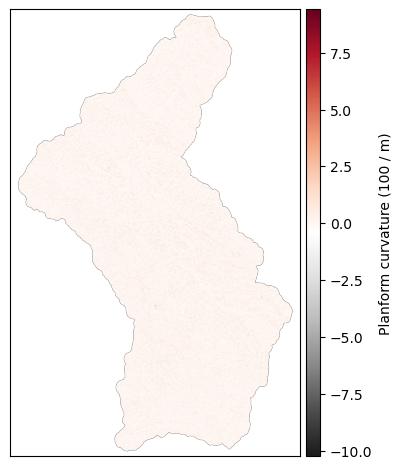

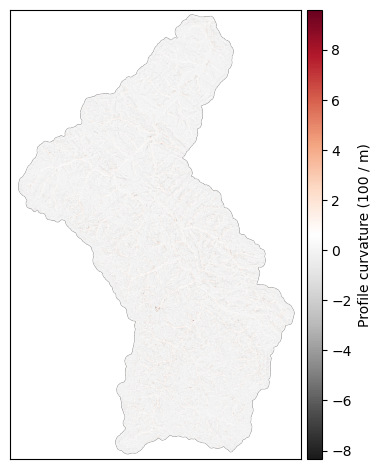

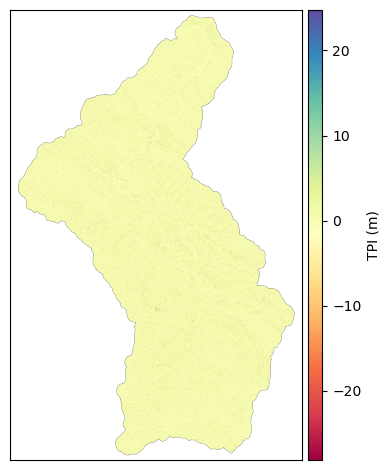

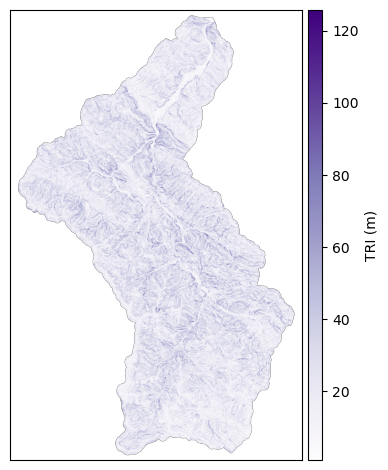

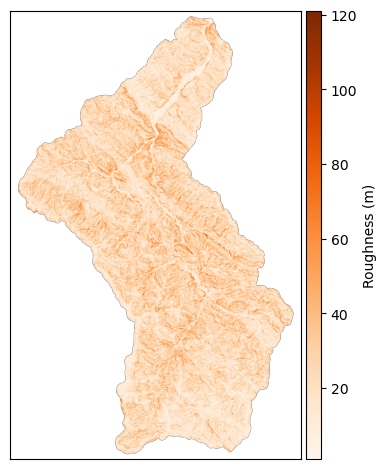

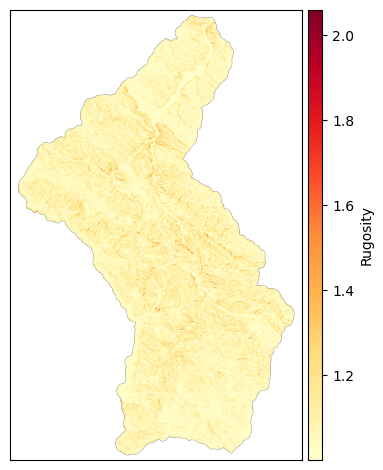


📂 copernicus_dеm_utm32635.tif


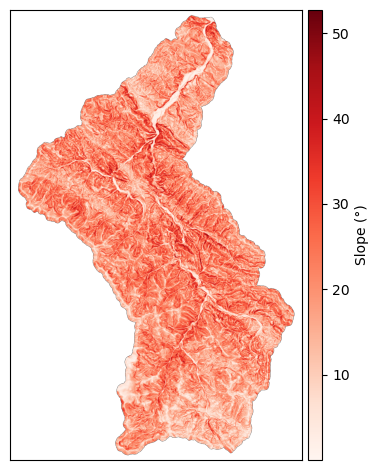

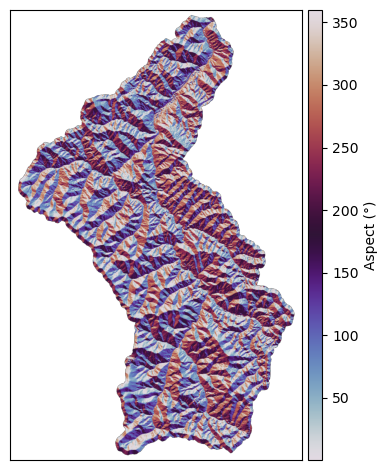

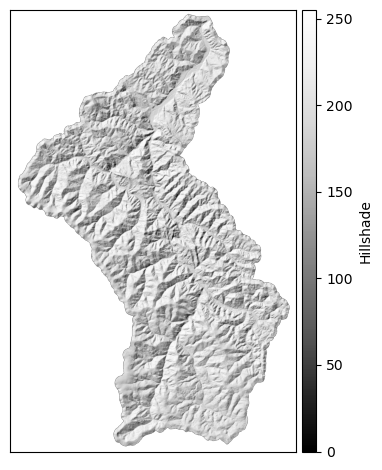

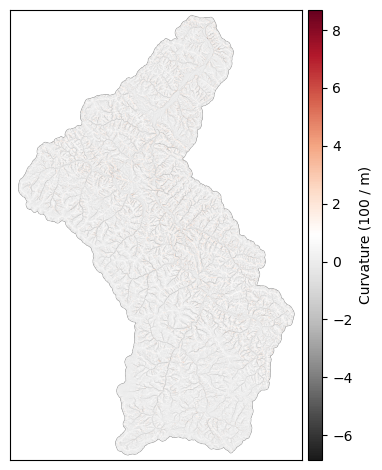

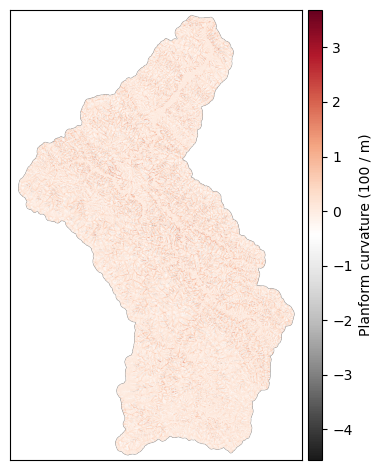

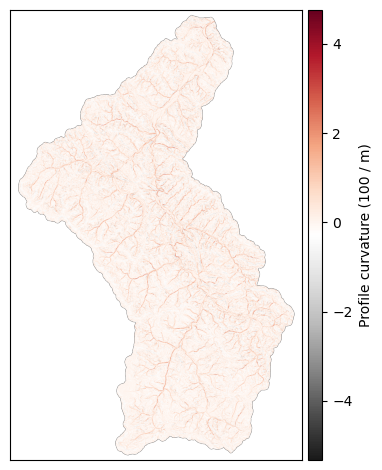

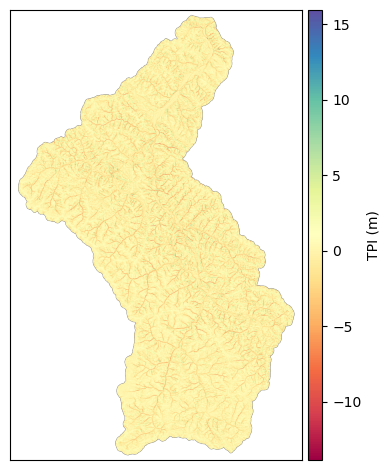

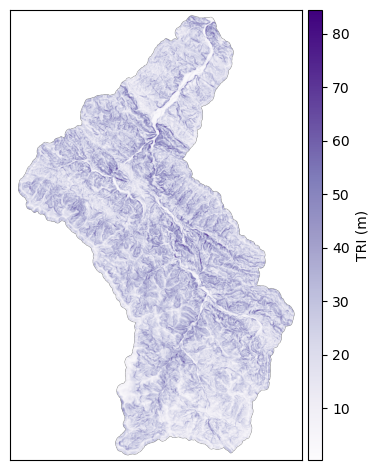

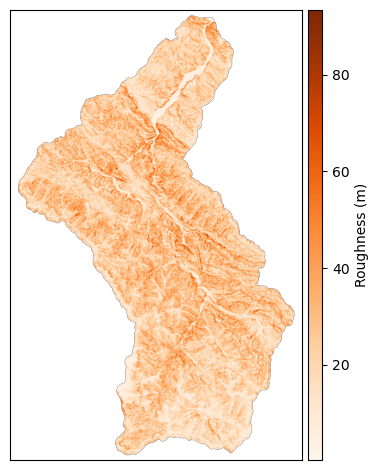

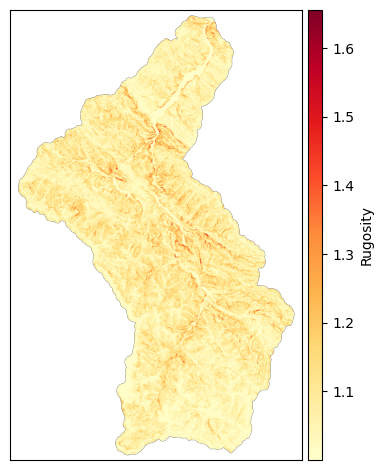


📂 fab_dem_utm32635.tif


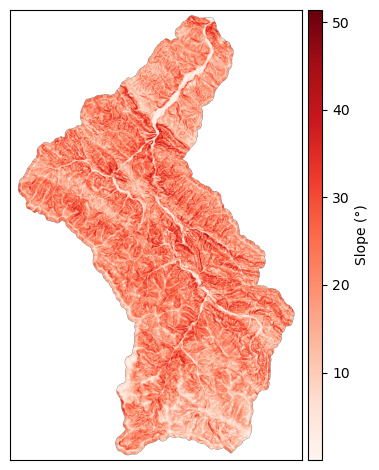

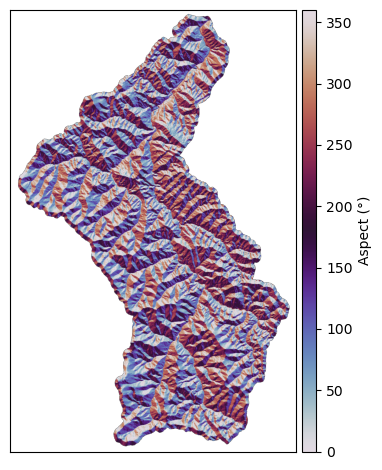

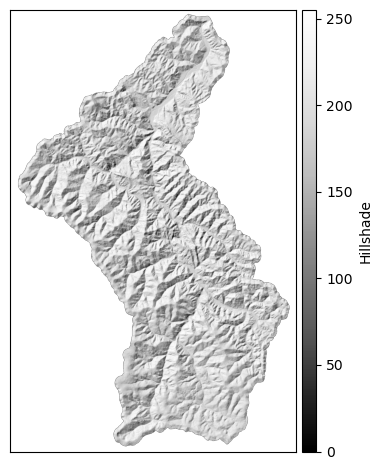

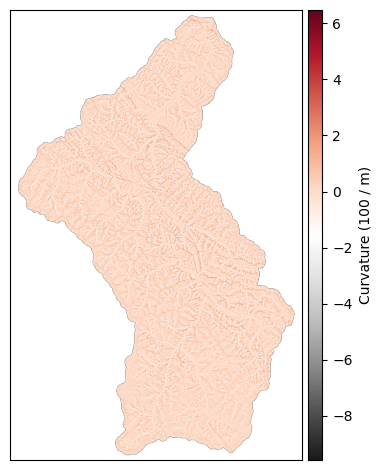

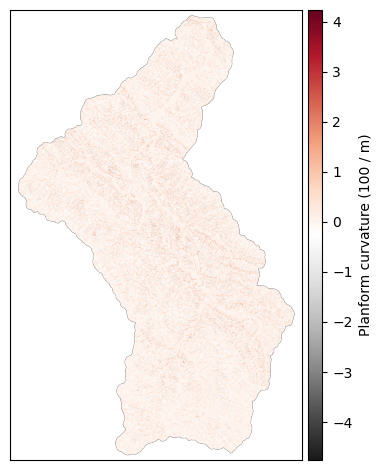

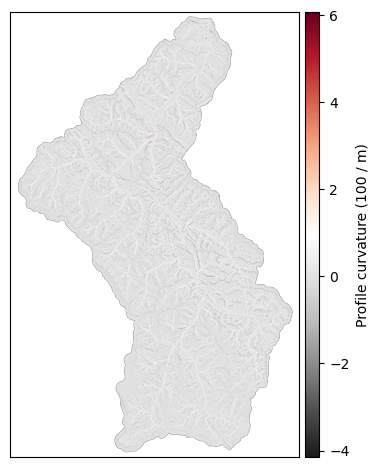

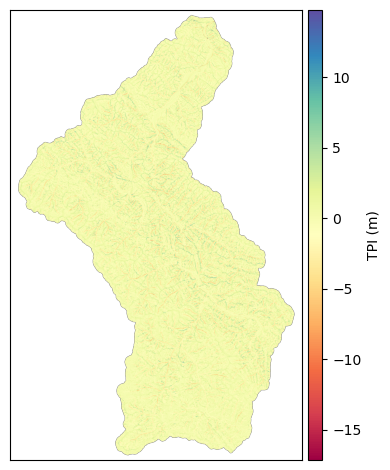

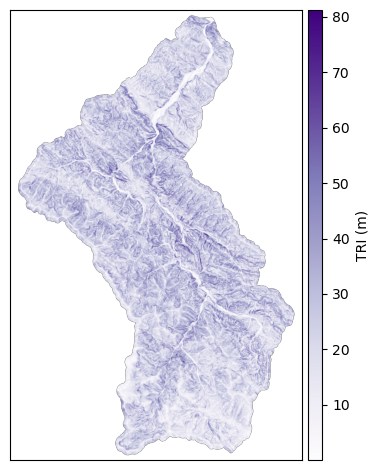

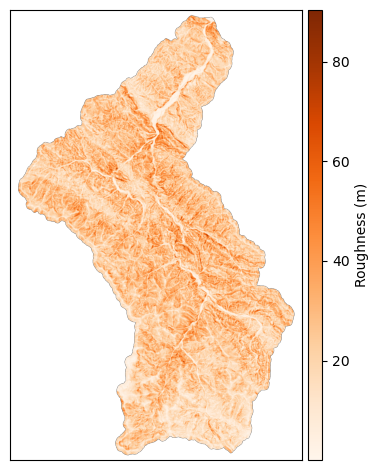

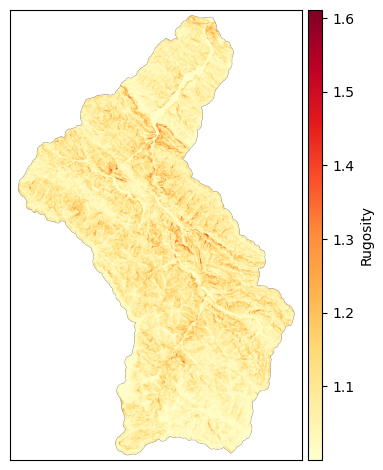


📂 nasa_dem_utm32635.tif


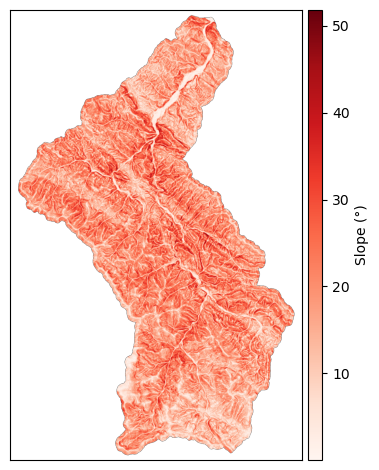

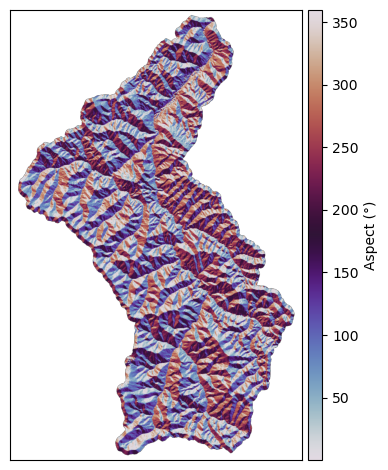

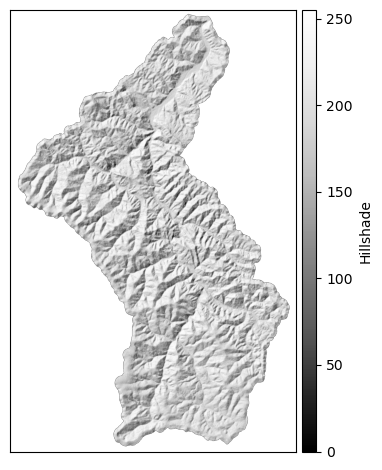

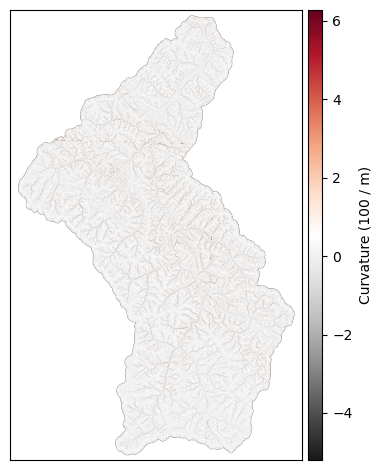

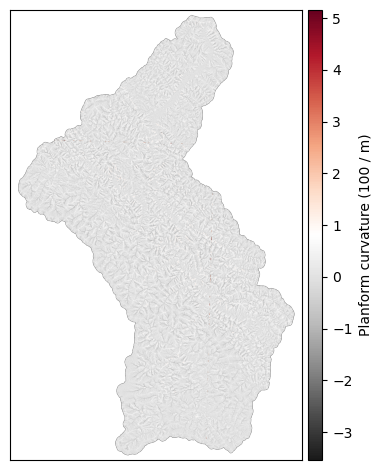

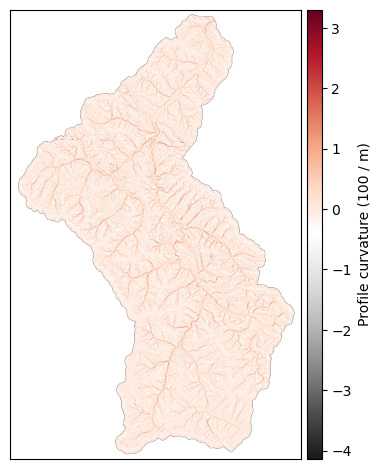

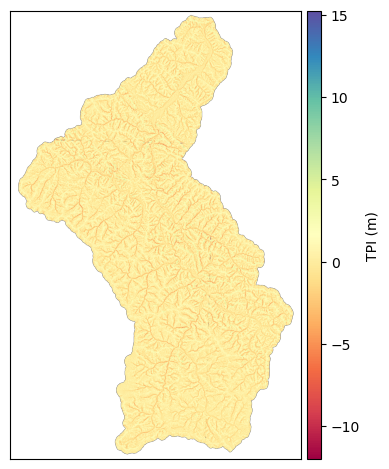

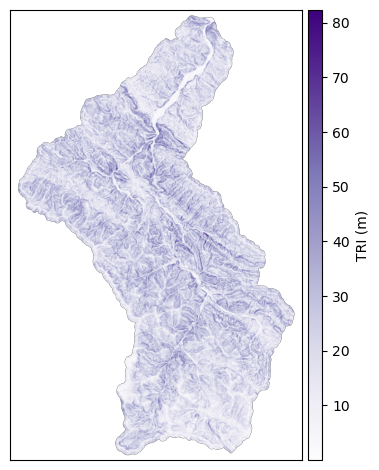

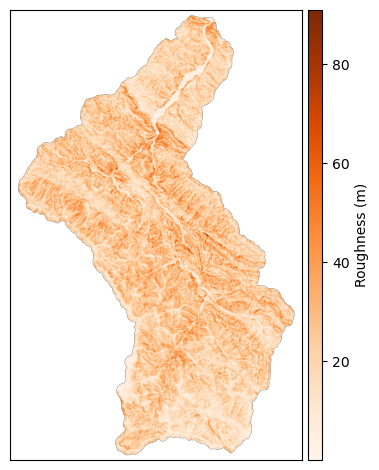

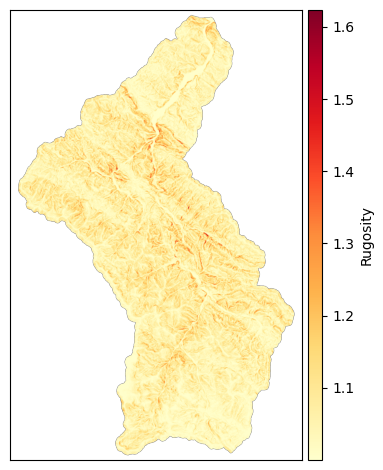


📂 srtm_dem_utm32635.tif


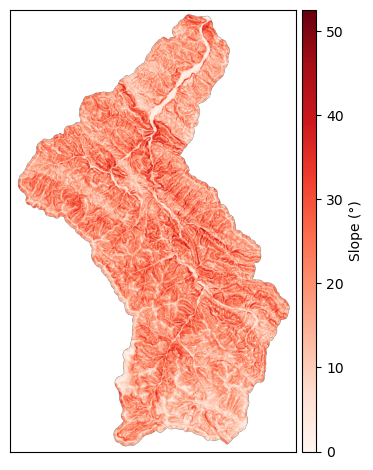

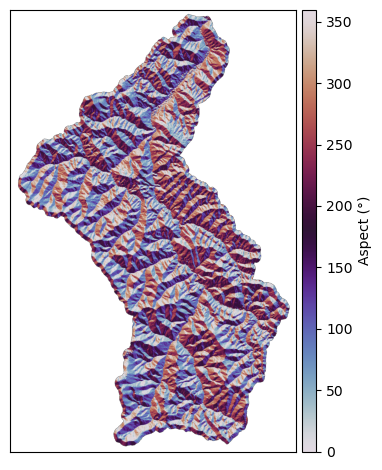

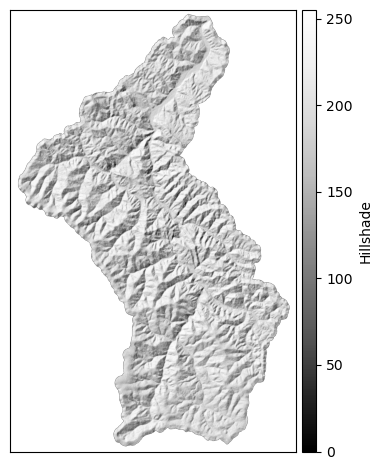

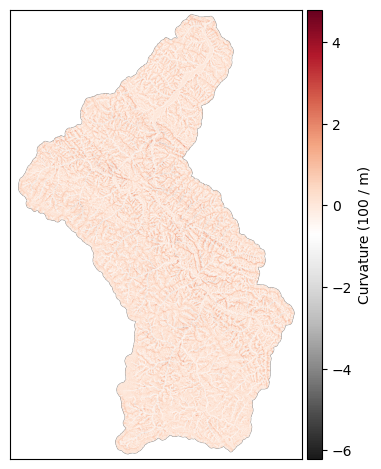

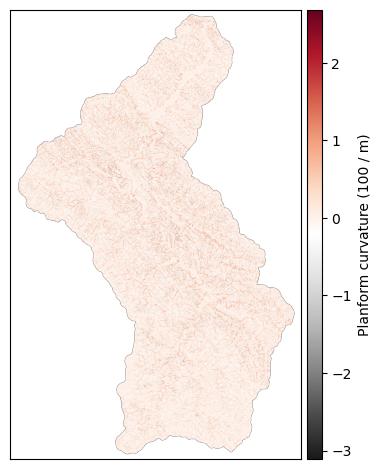

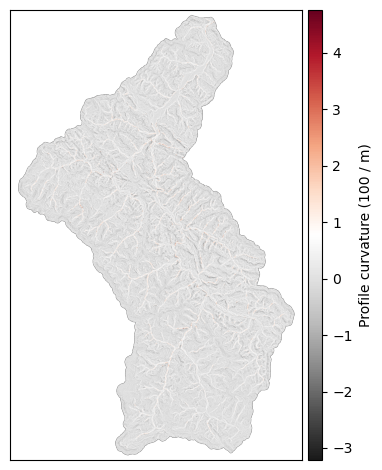

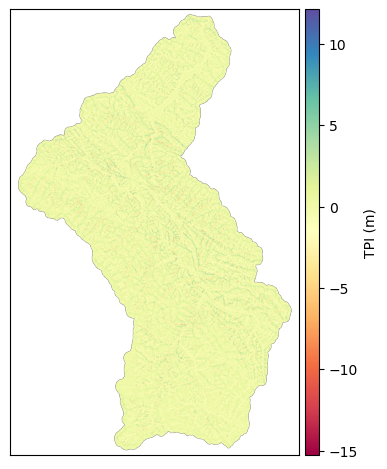

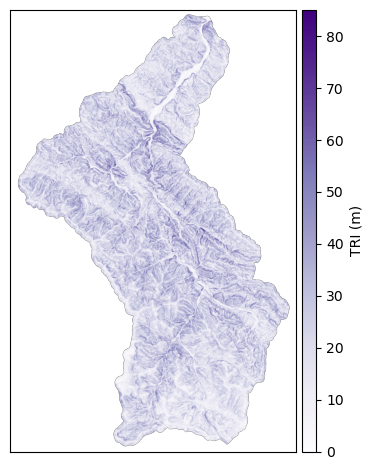

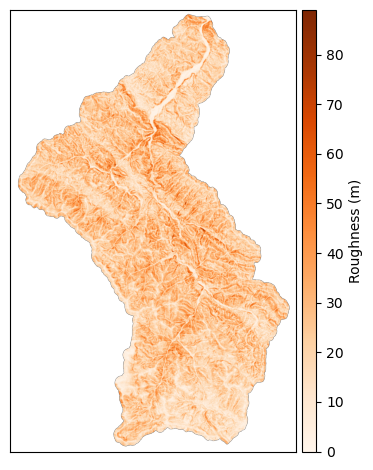

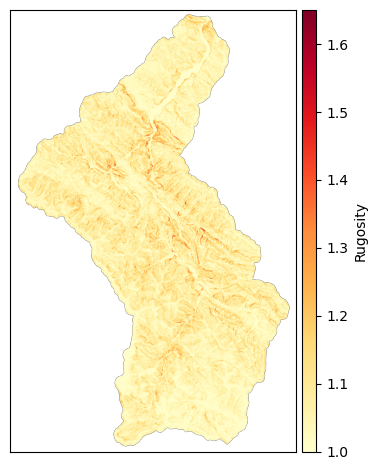


📂 tan_dem_utm32635.tif


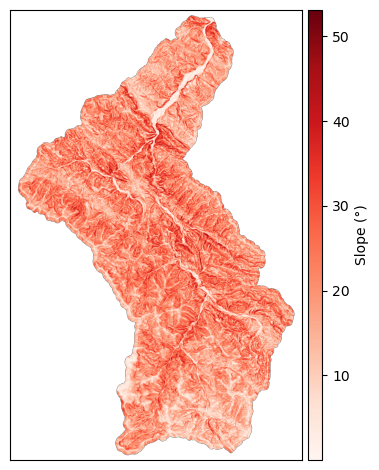

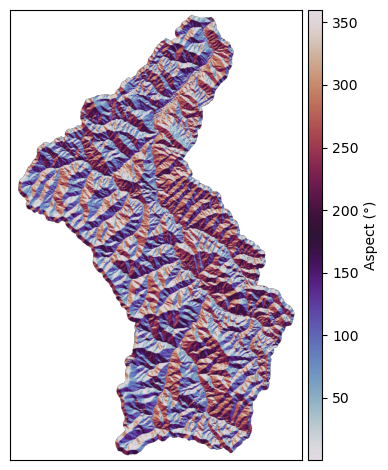

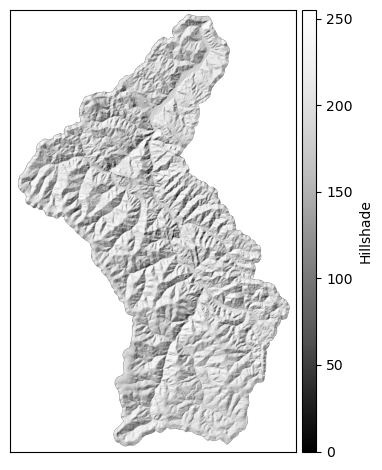

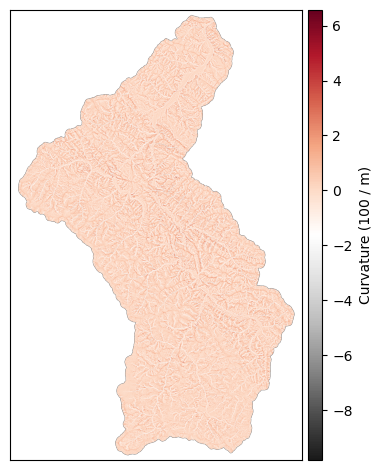

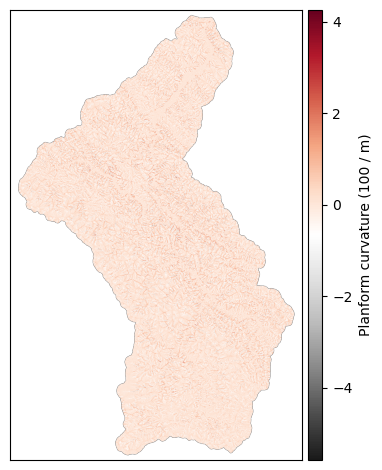

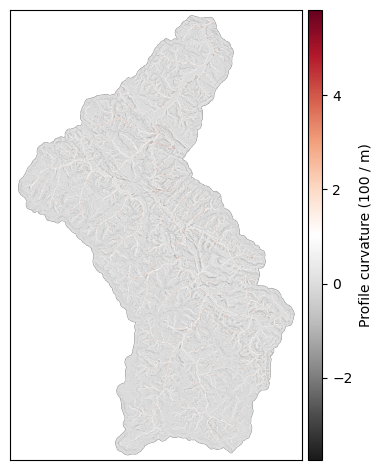

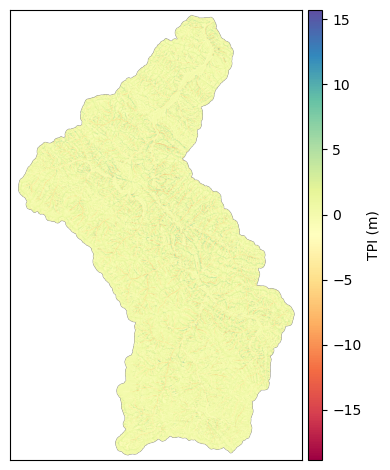

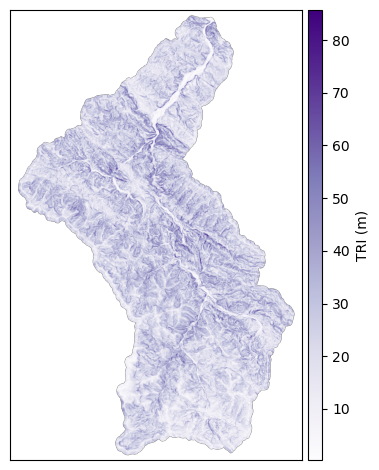

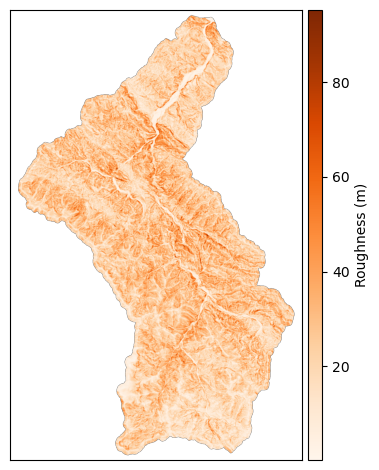

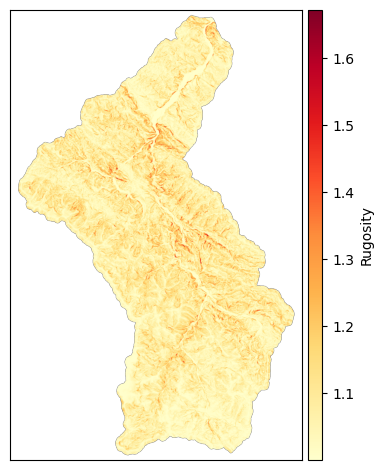

In [12]:
for path in dem_paths:
    print(f"\n📂 {path.name}")

    dem = xdem.DEM(path)

    # 1. Схил
    slope_horn = dem.slope(method="Horn")
    plot_attribute(slope_horn, "Reds", "Slope (°)")

    # 2. Аспект
    aspect = dem.aspect(method="Horn")
    plot_attribute(aspect, "twilight", "Aspect (°)")

    # 3. Hillshade (шадовий рельєф)
    hillshade = dem.hillshade()
    plot_attribute(hillshade, "Greys_r", "Hillshade")

    # 4. Кривизна (Curvature)
    curvature = dem.curvature()
    plot_attribute(curvature, "RdGy_r", "Curvature (100 / m)")

    # 5. Planform curvature
    planform_curv = dem.planform_curvature()
    plot_attribute(planform_curv, "RdGy_r", "Planform curvature (100 / m)")

    # 6. Profile curvature
    profile_curv = dem.profile_curvature()
    plot_attribute(profile_curv, "RdGy_r", "Profile curvature (100 / m)")

    # 7. Topographic position index (TPI)
    tpi = dem.topographic_position_index()
    plot_attribute(tpi, "Spectral", "TPI (m)")

    # 8. Terrain ruggedness index (TRI)
    tri = dem.terrain_ruggedness_index()
    plot_attribute(tri, "Purples", "TRI (m)")

    # 9. Roughness
    roughness = dem.roughness()
    plot_attribute(roughness, "Oranges", "Roughness (m)")

    # 10. Rugosity
    rugosity = dem.rugosity()
    plot_attribute(rugosity, "YlOrRd", "Rugosity")

    # 11. Fractal roughness (для великих DEM може бути повільно)
    # fractal_roughness = dem.fractal_roughness()
    # plot_attribute(fractal_roughness, "Reds", "Fractal roughness (dimensions)")

    # # Збереження прикладу аспекту
    # with rasterio.open(path) as src:
    #     profile = src.profile
    # profile.update(dtype="float32", count=1)
    # aspect_path = path.with_name(path.stem + "_aspect.tif")
    # with rasterio.open(aspect_path, "w", **profile) as dst:
    #     dst.write(aspect.data.astype("float32"), 1)
